# Lab Assignment Two: Exploring Image Data 

# Team Members: Aitor Gonzalez (49092725), Palmer Nelson (47066829), Abdul Wasay (49121481)

Dataset requirements: Choose a dataset that is comprised of image data.<br />
<font color="green">Sports Image Classification<br /></font>
https://www.kaggle.com/datasets/sidharkal/sports-image-classification
    
The data should be directories of images. That is, the dataset should not yet be pre-processed. The following are required for the dataset:<br />

**The data includes at least 1000 images***<br />
<font color="green">8227 images</font><br />

    
**The size of the images should be larger than 20x20 pixels**<br />
<font color="green">They are about 140x100 px or more</font><br />
   
**The dataset should have a well defined prediction task (i.e., a label for each image)**<br />
<font color="green">To determine the type of sport being played</font><br />
    
**The dataset cannot be MNIST or Fashion MNIST**<br />
<font color="green">We are not fashionable enough for that.</font><br />



# Business Understanding (2 points total).  
[2 points] Give an overview of the dataset. Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). 

<font color="green">
A set of pictures of sports being played<br />
under Open Data Commons Attribution License (ODC-By) v1.0 License<br />
taken from Kaggle url: https://www.kaggle.com/datasets/sidharkal/sports-image-classification<br />
composed of 8227 images<br />
The author describes it as "a dataset containing images of different sports classes. The dataset consists of images belonging to the following sports classes: cricket, wrestling, tennis, badminton, soccer, swimming, and karate. The test set contains unlabeled images for which you need to predict the class."<br />
<br />
We want to train the sports dataset for:<br />
1- memory training exercises for elderly or alzheimer's patients. For example, someone with Alzheimer's disease could use the image classification to identify sports that they may have seen, and train their brains to remain active in terms of memory and cognition - essentially gamifying the process of memory recollection.<br />
2- people watching sports channel  that may want to identify the type of sports being played. This can be paired with an app that finds fields/ events where that sport is being played in the area so that you may be able to book a slot through the app, making money for the develper based on ticket sales / ads for sports arenas. It can be further expanded to offer statistics of the current largest matches being played and the history of the teams, so that the user can get up to speed on the new kind of sports that they just discovered.
3- this could also be used for other intelligent data processing for larger organizations. Like if MLB wanted to go through a bunch of images in order find ones that are most related to them for marketing or analysis, <br />

</font>

### What is the prediction task for your dataset and which third parties would be interested in the results?

<font color="green">
The prediction task is to train the model on sports images in various environments, so that a new image being fed into it, can accurately predict the type of sports being seen
</font>

### Why is this data important? 

<font color="green">
This data is important because it allows for a simple and fun recognizable way for patients of Alzheimer's disease to keep their memory trained.
The large number of images also makes it so that the patient cannot solely rely on recognizing the image itself, but rather needs to interpret what they are seeing. Hence exercising the cognition.<br />
</font>

### Once you begin modeling, how well would your prediction algorithm need to perform to be considered useful to the identified third parties? Be specific and use your own words to describe the aspects of the data.

<font color="green">
    For the application of medical memory trainingm we argue 95% accuracy is important.This is because we do not want to confuse the patients using the app because it is being used to train their memory to perform better. A wrongly classified image will make it so that they may begin to associate the wrong images with what they remember. Hence when using this in a medical context, high accuracy is very important.
    
   For the sports app application, the accuracy does not need to be too accuarte, somewhere in the range of 70 to 80% is acceptable. This is assuming that someone who is intrigued by a ball sport, will be interested in playing other ball sports as well. 
</font>

# Data Preparation (1 points total)
### [.5 points] Read in your images as numpy arrays. Resize and recolor images as necessary. 

In [1]:
import pandas as pd
labels = pd.read_csv('train.csv')
labels_test=pd.read_csv('test.csv')

print (labels)

print(labels['label'].value_counts())

            image_ID      label
0     7c225f7b61.jpg  Badminton
1            b31.jpg  Badminton
2     acb146546c.jpg  Badminton
3     0e62f4d8f2.jpg  Badminton
4     cfd2c28c74.jpg    Cricket
...              ...        ...
8222  903d2fffb3.jpg    Cricket
8223  b5f174c688.jpg  Badminton
8224  2433770a67.jpg     Tennis
8225  6403964166.jpg     Tennis
8226  f07f00564e.jpg   Swimming

[8227 rows x 2 columns]
label
Cricket      1556
Wrestling    1471
Tennis       1445
Badminton    1394
Soccer       1188
Swimming      595
Karate        578
Name: count, dtype: int64


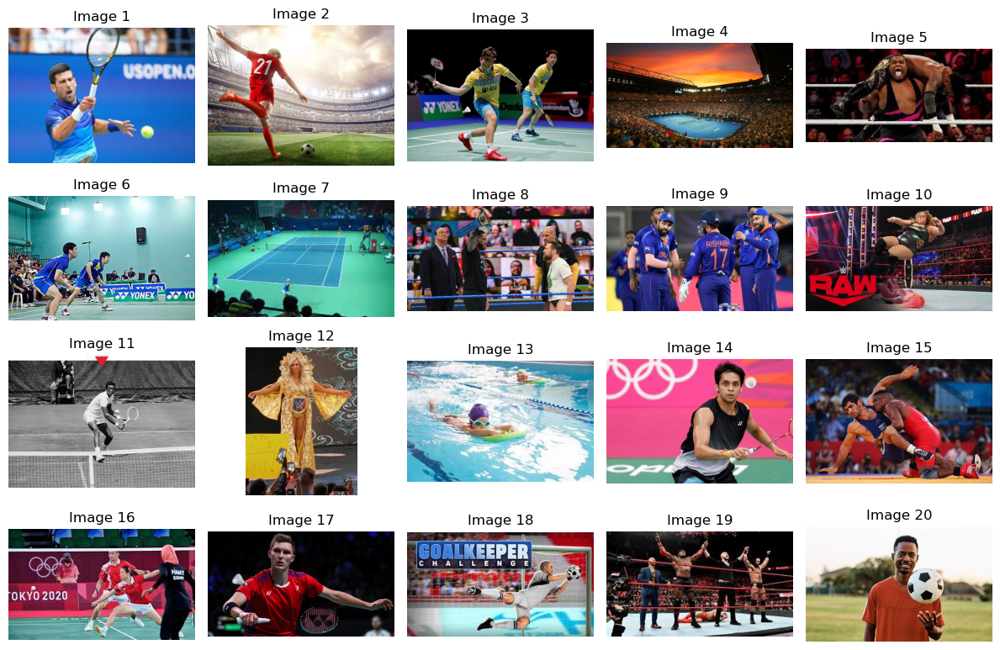

In [2]:
#now we show some images
from PIL import Image
import os
import random
import matplotlib.pyplot as plt

# Directory containing your images
image_dir = 'train'

# List all files in the image directory
file_list = os.listdir(image_dir)

# Number of images to display
num_images_to_display = 20

# Randomly select 20 unique images from the directory
selected_images = random.sample(file_list, num_images_to_display)

# Create a subplot for displaying the images
plt.figure(figsize=(12, 8))
for i, image_name in enumerate(selected_images):
    img = Image.open(os.path.join(image_dir, image_name))
    plt.subplot(4, 5, i + 1)  # Create a 4x5 grid of subplots
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i + 1}")

plt.tight_layout()
plt.show()


In [ ]:
#this code is to find out the different sizes of images that we have in order to better understand if cropping them makes sense
import os
from collections import defaultdict
from PIL import Image

#Define the directory containing your images
image_dir = 'train'

#Initialize a dictionary to store the image dimensions and their counts
image_dimensions = defaultdict(int)

#Loop through the images in the directory
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):
        # Open the image
        image_path = os.path.join(image_dir, filename)
        with Image.open(image_path) as img:
            # Get the dimensions of the image
            width, height = img.size

            # Store the dimensions in the dictionary
            image_dimensions[(width, height)] += 1

#Print the counts for different image dimensions
for dimensions, count in image_dimensions.items():
    print(f"Dimensions {dimensions}: {count} images")

In [8]:
#this is converting images to greyscale 

from PIL import Image
import os

# folder where images are stored
src_folder = "train"

# folder where to save the grayscale images
dest_folder = "grayscale"

# Create destination folder if it does not exist
if not os.path.exists(dest_folder):
    os.makedirs(dest_folder)

files_processed = 0

# Loop through each image in the source folder
for filename in os.listdir(src_folder):
    
    if filename.endswith('.jpg'):  # unnecessary as all files are jpg
        img_path = os.path.join(src_folder, filename)
        
        # Open the image
        img = Image.open(img_path).convert("L")
        
        # Save the grayscale image
        dest_path = os.path.join(dest_folder, filename)
        img.save(dest_path)
    files_processed += 1
    if (files_processed % 500 == 0): print(f"progress: {files_processed} / {len(os.listdir(src_folder))} = {(files_processed*100) / len(os.listdir(src_folder)):.2f}%")

progress: 500 / 8227 = 6.08%
progress: 1000 / 8227 = 12.16%
progress: 1500 / 8227 = 18.23%
progress: 2000 / 8227 = 24.31%
progress: 2500 / 8227 = 30.39%
progress: 3000 / 8227 = 36.47%
progress: 3500 / 8227 = 42.54%
progress: 4000 / 8227 = 48.62%
progress: 4500 / 8227 = 54.70%
progress: 5000 / 8227 = 60.78%
progress: 5500 / 8227 = 66.85%
progress: 6000 / 8227 = 72.93%
progress: 6500 / 8227 = 79.01%
progress: 7000 / 8227 = 85.09%
progress: 7500 / 8227 = 91.16%
progress: 8000 / 8227 = 97.24%


We have recolored into grayscale for better performance and avoid error maybe introduced due lighting or uneven coloring.
Now we resize them all to the same size.

Now we will resize images to 3:2 because that is what most of the images come out to be.
Size had to be reduced from 300,200because the dataframe buildup was taking 1 min per 0.1% of images. Which would mean that it would take 15 hours to load it into memory. This not feasible with our resources.
We can try 150x100

In [15]:
#this is changing dimensions of the images to singular dimension of (see code for size)

# folder where images are stored
src_folder = "grayscale"

# folder where to save the grayscale images
dest_folder = "resized"

# Create destination folder if it does not exist
if not os.path.exists(dest_folder):
    os.makedirs(dest_folder)

    
target_size = (150, 100)
files_processed = 0

# Loop through each image in the source folder
for file_name in file_list:
    if file_name.endswith('.jpg'):
        # Open the image using Pillow
        img = Image.open(os.path.join(src_folder, file_name))
        
        # Resize the image to the target size
        img = img.resize(target_size)
        
        # Save the resized image to the output directory
        img.save(os.path.join(dest_folder, file_name))
    files_processed += 1
    if (files_processed % 500 == 0): print(f"progress: {files_processed} / {len(os.listdir(src_folder))} = {(files_processed*100) / len(os.listdir(src_folder)):.2f}%")
print(f"progress: {files_processed} / {len(os.listdir(src_folder))} = {(files_processed*100) / len(os.listdir(src_folder)):.2f}%")

progress: 500 / 8227 = 6.08%
progress: 1000 / 8227 = 12.16%
progress: 1500 / 8227 = 18.23%
progress: 2000 / 8227 = 24.31%
progress: 2500 / 8227 = 30.39%
progress: 3000 / 8227 = 36.47%
progress: 3500 / 8227 = 42.54%
progress: 4000 / 8227 = 48.62%
progress: 4500 / 8227 = 54.70%
progress: 5000 / 8227 = 60.78%
progress: 5500 / 8227 = 66.85%
progress: 6000 / 8227 = 72.93%
progress: 6500 / 8227 = 79.01%
progress: 7000 / 8227 = 85.09%
progress: 7500 / 8227 = 91.16%
progress: 8000 / 8227 = 97.24%
progress: 8227 / 8227 = 100.00%


### [.1 points] Visualize several images.

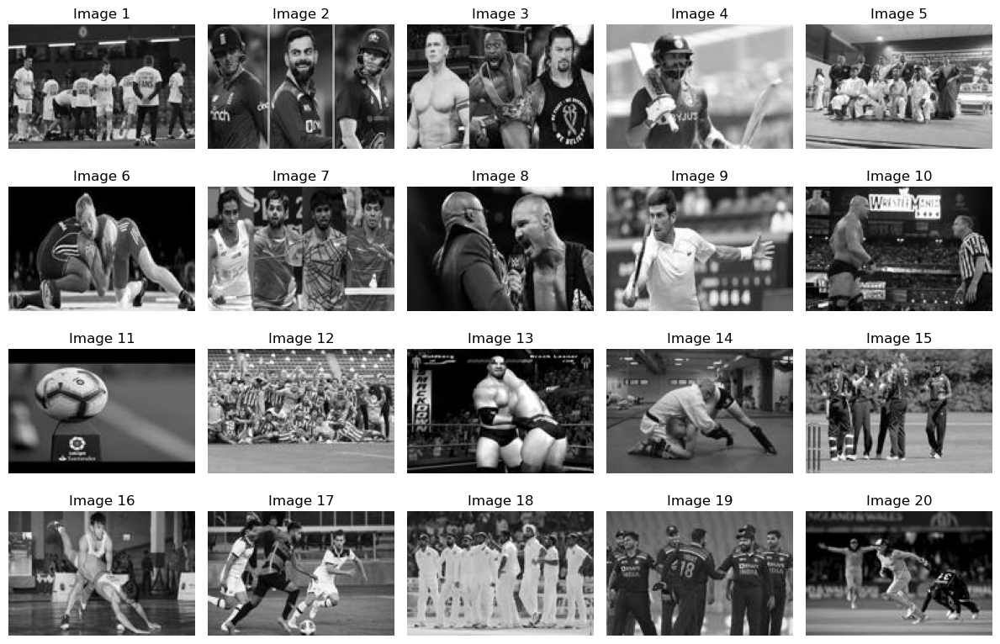

In [16]:
#now we show some images after grayscale and resized
from PIL import Image
import os
import random
import matplotlib.pyplot as plt

# Directory containing your images
image_dir = 'resized'

# List all files in the image directory
file_list = os.listdir(image_dir)

# Number of images to display
num_images_to_display = 20

# Randomly select 20 unique images from the directory
selected_images = random.sample(file_list, num_images_to_display)

# Create a subplot for displaying the images
plt.figure(figsize=(12, 8))
for i, image_name in enumerate(selected_images):
    img = Image.open(os.path.join(image_dir, image_name))
    plt.subplot(4, 5, i + 1)  # Create a 4x5 grid of subplots
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(f"Image {i + 1}")

plt.tight_layout()
plt.show()
        

### [.4 points] Linearize the images to create a table of 1-D image features (each row should be one image).   

In [1]:
import os
import numpy as np
import pandas as pd
from PIL import Image

# Directory containing images
image_dir = 'resized'

# List all files in the image directory
file_list = os.listdir(image_dir)

# Determine the dimensions for pre-allocated arrays
total_images = len(file_list)
feature_length = 150 * 100  # Change this to your actual feature length

# Initialize pre-allocated NumPy arrays
image_features = np.zeros((total_images, feature_length))
labels = np.empty(total_images, dtype=object)

# Load labels from a CSV file
labels_file = 'train.csv'
labels_df = pd.read_csv(labels_file)

# Create a dictionary to map image names to labels
image_to_label = dict(zip(labels_df['image_ID'], labels_df['label']))

files_processed = 0
for image_name in file_list:
    if image_name.endswith('.jpg'):
        # Open the image using Pillow
        img = Image.open(os.path.join(image_dir, image_name))

        # Flatten the image to a 1-D numpy array
        img_array = np.array(img).flatten()

        # Insert the image features into the pre-allocated array
        image_features[files_processed, :] = img_array

        # Retrieve the label for the image
        label = image_to_label.get(image_name, 'Unknown')  # Default to 'Unknown'

        # Insert the label into the pre-allocated array
        labels[files_processed] = label

        files_processed += 1
        if files_processed % 500 == 0:
            print(f"progress: {files_processed} / {total_images} = {(files_processed * 100) / total_images:.2f}%")

print(f"progress: {files_processed} / {total_images} = {(files_processed * 100) / total_images:.2f}%")

progress: 500 / 8227 = 6.08%
progress: 1000 / 8227 = 12.16%
progress: 1500 / 8227 = 18.23%
progress: 2000 / 8227 = 24.31%
progress: 2500 / 8227 = 30.39%
progress: 3000 / 8227 = 36.47%
progress: 3500 / 8227 = 42.54%
progress: 4000 / 8227 = 48.62%
progress: 4500 / 8227 = 54.70%
progress: 5000 / 8227 = 60.78%
progress: 5500 / 8227 = 66.85%
progress: 6000 / 8227 = 72.93%
progress: 6500 / 8227 = 79.01%
progress: 7000 / 8227 = 85.09%
progress: 7500 / 8227 = 91.16%
progress: 8000 / 8227 = 97.24%
progress: 8227 / 8227 = 100.00%


In [2]:
print(len(image_features))
print(len(labels))

8227
8227


In [4]:
import csv
with open("a_image_features.csv", "w", newline="") as f:
    writer = csv.writer(f)
    for row in image_features:
        writer.writerow(row)
        
with open("a_image_labels.csv", "w", newline="") as f:
    writer = csv.writer(f)
    for label in labels:
        writer.writerow([label])

In [20]:
# Create a DataFrame to store the 1-D image features
# THIS RUNS LIKE A DEAD DOG, NOT DOING IT WITH PANDAS DATAFRAME
# df = pd.DataFrame(image_features)
# <font color="green">We persist the data so that we can reload it directly rather than regenerating the dataframe (3+ hours!!!)</font>
# df.to_csv('D:/projects/jupyter/ml_1/lab_2/dataset/dataframe.csv', index=False)
# read
# df = pd.read_csv('dataframe.csv')

# Data Reduction (6 points total)
### [.5 points] Perform linear dimensionality reduction of the images using principal components analysis. Visualize the explained variance of each component. Analyze how many dimensions are required to adequately represent your image data. Explain your analysis and conclusion.

In [18]:
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Determine the maximum allowed n_components based on data dimensionality
num_components = len(image_features)

# Initialize PCA with the chosen number of components
pca = PCA(num_components=num_components)

# Fit PCA to the image features
image_features_pca = pca.fit_transform(image_features)

# Calculate the explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance)

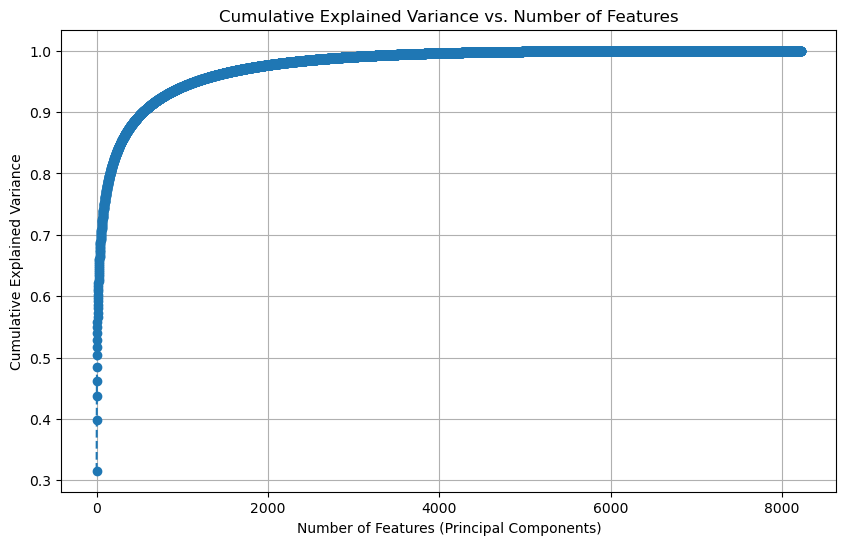

In [20]:
# Plot the explained variance ratio against the number of features (principal components)
plt.figure(figsize=(10, 6))
plt.plot(range(0, num_components), cumulative_explained_variance, marker='o', linestyle='--')
plt.xlabel('Number of Features (Principal Components)')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [3]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Determine the maximum allowed n_components based on data dimensionality
num_components = 3000

# Initialize PCA with the chosen number of components
%time pca = PCA(num_components)

# Fit PCA to the image features
%time pca.fit(image_features.copy())

CPU times: total: 0 ns
Wall time: 0 ns
CPU times: total: 7min 24s
Wall time: 1min 59s


PCA(n_components=3000)

In [4]:
# Calculate the explained variance ratio
target_size = (150, 100)

%time explained_variance = pca.explained_variance_ratio_
%time eigen_sports = pca.components_.reshape((num_components,target_size[1],target_size[0]))

# cumulative_explained_variance = np.cumsum(explained_variance)

CPU times: total: 0 ns
Wall time: 0 ns
CPU times: total: 0 ns
Wall time: 0 ns


In [5]:
def plot_explained_variance(pca,explained_variance):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook

    cum_var_exp = np.cumsum(explained_variance)

    plotly.offline.iplot({
        "data": [Bar(y=explained_variance, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })

plot_explained_variance(pca,explained_variance)
plt.show()

## Principal components Analysis
<font color="darkgreen">
As can be seen from the first graph, using all the components is inefficient, we reduced the number of components to 3000, that explains 99% of the variance within our images. 

Now we will reconstruct the images based on the reduced components. 
</font>

In [6]:
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

# plot_gallery(X, names[y], h, w)

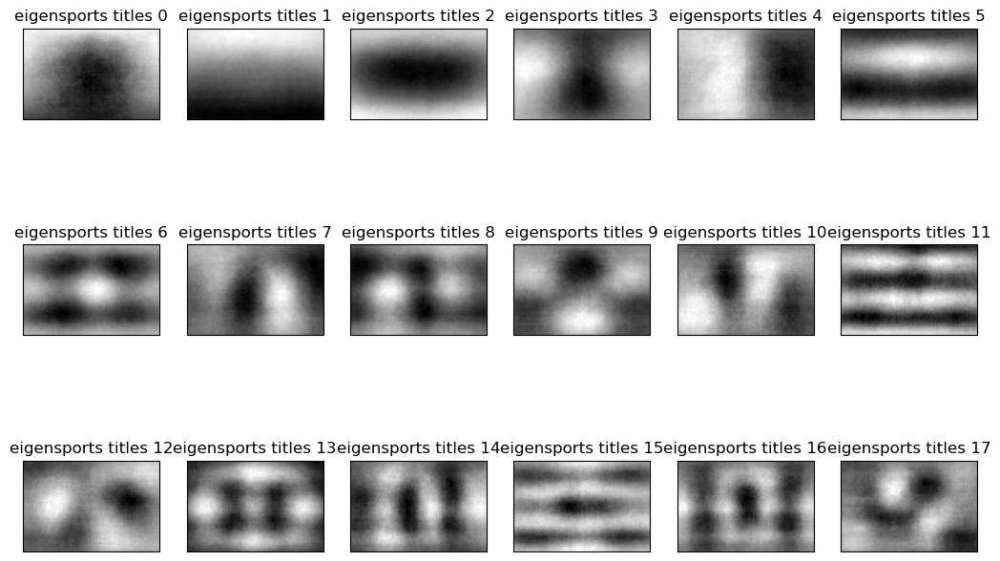

In [7]:
eigen_sports_titles = ["eigensports titles %d" % i for i in range(eigen_sports.shape[0])]
plot_gallery(eigen_sports, eigen_sports_titles, target_size[1],target_size[0])

In [8]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
idx_to_reconstruct = 2000    
image_features_idx = image_features[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,image_features_idx.reshape(1, -1))

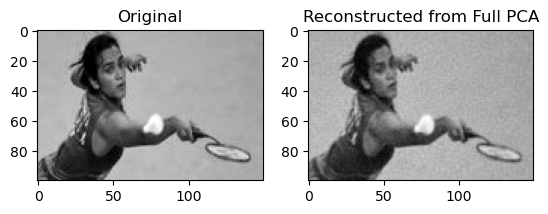

In [9]:
plt.subplot(1,2,1)
plt.imshow(image_features_idx.reshape((target_size[1],target_size[0])), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((target_size[1],target_size[0])), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid(False)

### [.5 points] Perform linear dimensionality reduction of your image data using randomized principle components analysis. Visualize the explained variance of each component. Analyze how many dimensions are required to adequately represent your image data. Explain your analysis and conclusion.

In [10]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Determine the maximum allowed n_components based on data dimensionality
num_components = 3000

# Initialize PCA with the chosen number of components
%time rpca = PCA(n_components=num_components, svd_solver='randomized')

# Fit PCA to the image features
%time rpca.fit(image_features.copy())

# Calculate the explained variance ratio
target_size = (150, 100)

%time explained_variance = pca.explained_variance_ratio_
%time eigen_sports = rpca.components_.reshape((num_components,target_size[1],target_size[0]))

# cumulative_explained_variance = np.cumsum(explained_variance)

CPU times: total: 0 ns
Wall time: 0 ns
CPU times: total: 7min 19s
Wall time: 1min 58s
CPU times: total: 0 ns
Wall time: 0 ns
CPU times: total: 0 ns
Wall time: 0 ns


In [11]:
plot_explained_variance(rpca,explained_variance)
plt.show()

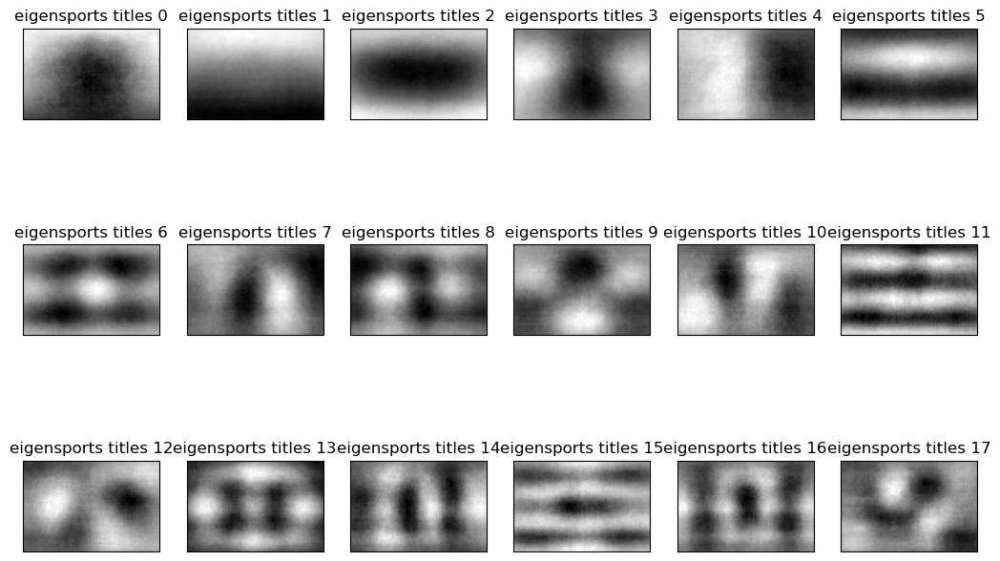

In [12]:
eigen_sports_titles = ["eigensports titles %d" % i for i in range(eigen_sports.shape[0])]
plot_gallery(eigen_sports, eigen_sports_titles, target_size[1],target_size[0])

In [13]:
idx_to_reconstruct = 8000    
image_features_idx = image_features[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,image_features_idx.reshape(1, -1))
low_dimensional_representation, reconstructed_image_rnd = reconstruct_image(rpca,image_features_idx.reshape(1, -1))

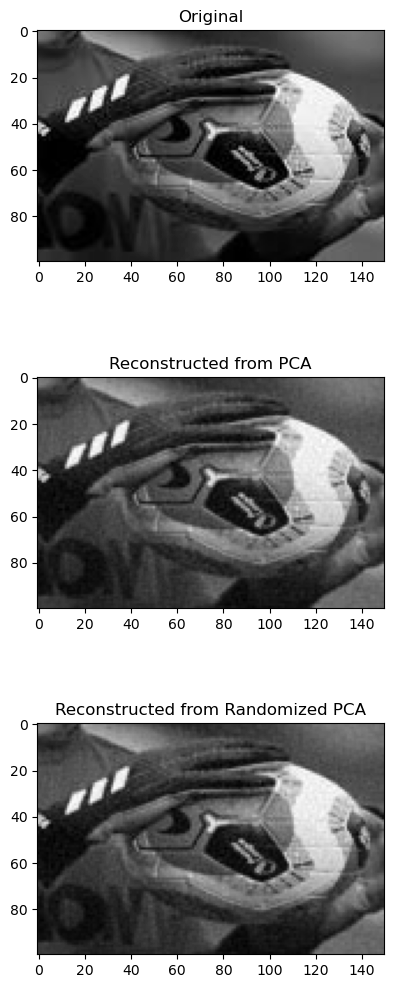

In [14]:
plt.figure(figsize=(10, 12))  # Increase the figure size to give more room
plt.subplots_adjust(hspace=0.5)  # Add space between subplots

plt.subplot(3,1,1)
plt.imshow(image_features_idx.reshape((target_size[1], target_size[0])), cmap=plt.cm.gray)
plt.title('Original')
plt.grid(False)

plt.subplot(3,1,2)
plt.imshow(reconstructed_image.reshape((target_size[1], target_size[0])), cmap=plt.cm.gray)
plt.title('Reconstructed from PCA')
plt.grid(False)

plt.subplot(3,1,3)
plt.imshow(reconstructed_image_rnd.reshape((target_size[1], target_size[0])), cmap=plt.cm.gray)
plt.title('Reconstructed from Randomized PCA')
plt.grid(False)

plt.show()


### [2 points]  Compare the representation using PCA and Randomized PCA. The method you choose to compare dimensionality methods should quantitatively explain which method is better at representing the images with fewer components.  Do you prefer one method over another? Why?

Aparently similar result.
Original features = 150*100 = 15000
PCA gives .99 (99%) explained covariance at 3000 components
Randomized gives .9899 (98.99%) explained covariance at 3000 components
This means that PCA is slightly superior.
But in general for our data at all levels of components the explained covariance is almost identical.




### [1 points] Perform feature extraction upon the images using any feature extraction technique (e.g., gabor filters, ordered gradients, DAISY, etc.).

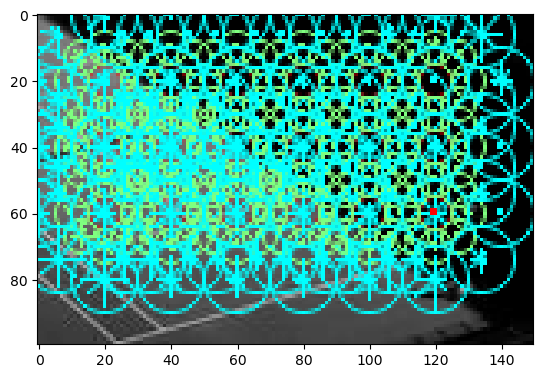

In [16]:
from skimage.feature import daisy

#        img = Image.open(os.path.join(image_dir, image_name))


# lets first visualize what the daisy descriptor looks like
features, img_desc = daisy(img, 
                           step=20, 
                           radius=20, 
                           rings=2, 
                           histograms=8, 
                           orientations=8, 
                           visualize=True)
plt.imshow(img_desc)
plt.grid(False)
plt.show()

In [ ]:
# now let's understand how to use it
features = daisy(img, step=10, radius=20, rings=2, histograms=8, orientations=4, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

In [ ]:
# create a function to take in the row of the matrix and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=10, radius=20, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

In [ ]:
0.026 * len(X) # approximate how long it may run

In [ ]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

In [ ]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

In [ ]:
import copy
# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

In [ ]:
from ipywidgets import fixed
# put it together inside a nice widget
def closest_image(dmat_daisy, dmat_pca, idx1):
    # NOTE: this will not suffice for evaluation 
    # of a nearest neighbor classifier for your lab assignment
    # do not use this code for satifying the lab assignment requirement
    
    distances = copy.deepcopy(dmat_daisy[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X[idx1].reshape((h,w)))
    plt.title("Original:"+names[y[idx1]])
    plt.grid()

    plt.subplot(1,3,2)
    imshow(X[idx2].reshape((h,w)))
    plt.title("DAISY Closest:"+names[y[idx2]])
    plt.grid()
    
    plt.subplot(1,3,3)
    imshow(X[idx3].reshape((h,w)))
    plt.title("PCA Closest:"+names[y[idx3]])
    plt.grid()
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_daisy=fixed(dist_matrix),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

In [ ]:
pca_obj = PCA(n_components=3000)
X_pca_features = pca_obj.fit_transform(X)

### [2 points] Does this feature extraction method show promise for your prediction task? Why? Use visualizations to analyze this questions. For example, visualize the differences between statistics of extracted features in each target class. Another option, use a heat map of the pairwise differences (ordered by class) among all extracted features. Another option, build a nearest neighbor classifier to see actual classification performance.

### One idea (required for 7000 level students): Perform feature extraction upon the images using DAISY. Rather than using matching on the images with the total DAISY vector, you will instead use key point matching. You will need to investigate appropriate methods for key point matching using DAISY. NOTE: this often requires some type of brute force matching per pair of images, which can be computationally expensive. Does it perform better than not using key point matching?

# Compare code

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

# Load iris dataset
iris = load_iris()

# Split dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    iris.data, iris.target, test_size=0.4, random_state=4
)

# Instantiate kNN model with k=5
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the model with data
knn.fit(X_train, y_train)

# Test the model with test set
y_pred = knn.predict(X_test)

# Accuracy of the model
print(f"Test set accuracy: {metrics.accuracy_score(y_test, y_pred)}")


### Exceptional Work (1 points total)
#### You have free reign to provide any additional analyses.

In [ ]:
# # Sandbox calcs from lecture!
# import numpy as np
# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA
# from matplotlib import pyplot as plt
# %matplotlib inline

# x = np.array([[14,12.6],[26,26.6],[36.3,33.3],[2.5,3.6],[15,17.4],[8,11]])
# # x = np.array([[1,0,0],[0,1,0],[1,0,0],[0,0,1],[0,1,0],[0,1,0]])
# print(x)
# plt.plot(x[:,0],x[:,1],'.')

# pcaobj = PCA(n_components=2)
# x_new = pcaobj.fit_transform(x)
# print(x_new)
# print(pcaobj.components_)

# x = StandardScaler(with_std=False).fit_transform(x)
# print(x)
# x_cov = np.cov(x.T)
# print(x_cov)
# eigenvalues, eigenvectors = np.linalg.eig(x_cov)
# print (eigenvectors, eigenvalues)

# StandardScaler(with_std=False).fit_transform(pcaobj.inverse_transform(x_new))

## Explained Variance
Recall that the explained variance is a factor of the eigen values. We can access these via the following equation:

$$ r_q=\frac{\sum_{j=1}^q \lambda_j}{\sum_{\forall i} \lambda_i} $$

# PCA With Image Data
This is code manipulated from Olivier Grisel's eigen face classification demonstration. You can find the original notebook here: http://nbviewer.ipython.org/github/ogrisel/notebooks/blob/master/Labeled%20Faces%20in%20the%20Wild%20recognition.ipynb

In [ ]:
# fetch the images for the dataset
# this will take a long time the first run because it needs to download
# after the first time, the dataset will be saved to your disk (in sklearn package somewhere) 
# if this does not run, you may need additional libraries installed on your system (install at your own risk!!)
from sklearn.datasets import fetch_lfw_people

lfw_people = fetch_lfw_people(min_faces_per_person=20, resize=None)

In [ ]:
# get some of the specifics of the dataset
X = lfw_people.data
y = lfw_people.target
names = lfw_people.target_names

n_samples, n_features = X.shape
_, h, w = lfw_people.images.shape
n_classes = len(names)

print(np.sum(~np.isfinite(X)))
print("n_samples: {}".format(n_samples))
print("n_features: {}".format(n_features))
print("n_classes: {}".format(n_classes))
print("Original Image Sizes {} by {}".format(h,w))
print (125*94) # the size of the images are the size of the feature vectors

So basically each feature vector is a giant image with the rows of the image just stacked one after the other into a giant vector. The image sizes are 125 pixels by 94 pixels. This gives us 125x94=11750 pixels per image.

So we are using each pixel location in the image as a separate feature. Wow. That's a lot of features. The process is as follows:

<img src="https://i.ytimg.com/vi/_lY74pXWlS8/maxresdefault.jpg" alt="Drawing" width="500"/>

In [ ]:
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())

plot_gallery(X, names[y], h, w) # defaults to showing a 3 by 6 subset of the faces

## PCA For Image Classification

In [ ]:
from ipywidgets import fixed
import copy

from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features

X_pca_features = rpca.transform(copy.deepcopy(X))
dist_matrix_pca = pairwise_distances(copy.deepcopy(X_pca_features),
                                     metric="seuclidean")

                                       
# put it together inside a nice widget
def closest_image(dmat_pca, idx1):
    
    # NOTE: this will NOT suffice for evaluation of a nearest neighbor classifier for your lab assignment
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image distances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances) #pca
    
    distances[idx2] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances) # pixels
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    plt.imshow(X[idx1].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Original:"+names[y[idx1]])
    plt.grid(False)

    plt.subplot(1,3,2)
    plt.imshow(X[idx2].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Closest:"+names[y[idx2]])
    plt.grid(False)
    
    plt.subplot(1,3,3)
    plt.imshow(X[idx3].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Next Closest:"+names[y[idx3]])
    plt.grid(False)
    plt.show()
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

____
# Image Processing Crash Course
Now let's look at other Methods for extracting features from images.

Let's start by calculating gradients:

In [ ]:
from skimage.io import imshow
from skimage.filters import sobel_h, sobel_v

plt.subplot(1,2,1)
idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))
imshow(img)
plt.grid(False)


plt.subplot(1,2,2)
gradient_mag = np.sqrt(sobel_v(img)**2 + sobel_h(img)**2 ) 
imshow(gradient_mag)
plt.grid(False)
plt.show()

## Image Feature: DAISY Bag of Features Model
As discussed in lecture, DAISY Features are a means of looking at histograms of edges weights using gradients at various orientations (if you are new to this, that is not a satisfying explanation, please look back at the notes/slides for the course.). 

http://scikit-image.org/docs/dev/_images/sphx_glr_plot_daisy_001.png

In [ ]:
from skimage.feature import daisy

# lets first visualize what the daisy descriptor looks like
features, img_desc = daisy(img, 
                           step=20, 
                           radius=20, 
                           rings=2, 
                           histograms=8, 
                           orientations=8, 
                           visualize=True)
imshow(img_desc)
plt.grid(False)
plt.show()

## Bonus: K-Nearest Neighbor Classification with each Feature Space

You can skip this if you want, it's only for an intuition about how it works
Let's try getting a more quantitative measure of performance by using a sklearn classifier for each feature space.

In [ ]:
 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

# init a classifier for each feature space
knn_pca = KNeighborsClassifier(n_neighbors=1)
knn_dsy = KNeighborsClassifier(n_neighbors=1)

# separate the data into train/test
pca_train, pca_test, dsy_train, dsy_test, y_train, y_test = train_test_split(
    X_pca_features,daisy_features, y, test_size=0.2, train_size=0.8)

# fit each classifier
knn_pca.fit(pca_train,y_train)
acc_pca = accuracy_score(knn_pca.predict(pca_test),y_test)

knn_dsy.fit(dsy_train,y_train)
acc_dsy = accuracy_score(knn_dsy.predict(dsy_test),y_test)

# report accuracy
print(f"PCA accuracy:{100*acc_pca:.2f}%, Daisy Accuracy:{100*acc_dsy:.2f}%".format())

## In this notebook you learned:

- Principle Components Analisys 
- Randomized PCA
- Image Features (like Daisy)
- Classifying Images with Nearest Neighbor Distance
 - Using both quantitative and qualitative methods 
- BONUS Content in this Notebook: 
 - Matching techniques 
 - Gabor Filters as a Feature 
 - Kernel PCA



In [ ]:
# for the exceptional credit, you might be interested in the following code
# you will need to repeat this for all pairs of images in the testing and training 
from skimage.feature import match_descriptors

def apply_daisy(row,shape): # no reshape in this function
    feat = daisy(row.reshape(shape), step=5, radius=5, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    s = feat.shape # PxQxR
    #P = ceil((Height - radius*2) / step) 
    #Q = ceil((Width - radius*2) / step) 
    #R = (rings * histograms + 1) * orientations
    return feat.reshape((s[0]*s[1],s[2]))

d1 = apply_daisy(X[10],(h,w))
d2 = apply_daisy(X[11],(h,w))
d3 = apply_daisy(X[0],(h,w))

print(d1.shape, d2.shape, d3.shape)
print('Classes:',y[10],y[11],y[0])

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d2, cross_check=True, max_ratio=0.8)
print(f"Number of matches, same class: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

# return list of the key points indices that matched closely enough
matches = match_descriptors(d1, d3, cross_check=True, max_ratio=0.8)
print(f"Number of matches, diff classes: {matches.shape[0]}, Percentage:{100*matches.shape[0]/len(d1):0.2f}%")

____
____
____

## Gabor Kernels for Feature Extraction [if time]

We do not typically cover this in class, but students are welcome to look at this additional feature space. 

In [ ]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

# prepare filter bank kernels
kernels = []
for theta in range(8):# orientations
    theta = theta / 8. * np.pi
    for sigma in (1, 3, 5): # std
        for frequency in (0.05, 0.15, 0.25, 0.35): # frequency
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

            
# compute the filter bank and take statistics of image
# this can be drastically sped up using the 2D FFT
def compute_gabor(row, kernels, shape):
    feats = np.zeros((len(kernels), 4), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(row.reshape(shape), kernel, mode='wrap')
        _,_,feats[k,0],feats[k,1],feats[k,2],feats[k,3] = stats.describe(filtered.reshape(-1))
        # mean, var, skew, kurt
        
    return feats.reshape(-1)

idx_to_reconstruct = int(np.random.rand(1)*len(X))

gabr_feature = compute_gabor(X[idx_to_reconstruct], kernels, (h,w))
gabr_feature.shape

In [ ]:
# takes some time to run entire dataset (using lots of orientations, std, and frequency)
%time gabor_stats = np.apply_along_axis(compute_gabor, 1, X, kernels, (h,w))
print(gabor_stats.shape)

In [ ]:
knn_gab = KNeighborsClassifier(n_neighbors=1)

gab_train, gab_test, y_train, y_test = train_test_split(
    gabor_stats,y,test_size=0.2, train_size=0.8)
knn_gab.fit(gab_train,y_train)
acc_gab = accuracy_score(knn_gab.predict(gab_test),y_test)

print(f"Gabor accuracy: {100*acc_gab:.2f}%")

**Is gabor filtering a good feature extraction method for this dataset?**

## Kernel PCA (deprecated)
Warning: the block of code below takes a long time to run. Kernel methods typically take some time, so I would advise subsampling the data before using the kernel. 

In [ ]:
# %%time

# from sklearn.decomposition import KernelPCA

# n_components = 300
# print ("Extracting the top %d eigenfaces from %d faces, not calculating inverse transform" % (n_components, X.shape[0]))

# kpca = KernelPCA(n_components=n_components, kernel='rbf', 
#                 fit_inverse_transform=False, gamma=0.01, # very sensitive to the gamma parameter,
#                 remove_zero_eig=True)  
# kpca.fit(X.copy())

In [ ]:
# %%time
# #  depending on sklearn version, THIS MAY TAKE A WHILE TO RUN
# #   but it shouldn't
# from sklearn.decomposition import KernelPCA

# n_components = 300
# print ("Extracting the top %d eigenfaces from %d faces, ALSO getting inverse transform" % (n_components, X.shape[0]))

# kpca = KernelPCA(n_components=n_components, kernel='rbf', 
#                 fit_inverse_transform=True, gamma=0.1, # very sensitive to the gamma parameter,
#                 remove_zero_eig=True)  
# kpca.fit(X.copy())

In [ ]:
# x_flat = X[0].reshape(1, -1)
# reconstructed_image_kernelpca = kpca.inverse_transform(kpca.transform(x_flat.copy()))

# plt.subplot(1,2,1)
# plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
# plt.title('Original')
# plt.grid(False)
# plt.subplot(1,2,2)
# plt.imshow(reconstructed_image_kernelpca.reshape((h, w)), cmap=plt.cm.gray)
# plt.title('Reconstructed from Kernel PCA')
# plt.grid(False)

In [ ]:
# # the above operation takes a long time to save the inverse transform parameters
# # so let's save out the results to load in later!
# # NOTE: the directory large_data must already exist to run this block
# import pickle

# pickle.dump(kpca, open( 'large_data/kpca.p', 'wb' ))

In [ ]:
# Load the Kpca

In [ ]:
# # NOTE: the directory large_data must already exist to run this block
# # and you should have already saved thekpca object into the directory
# import pickle
# kpca = pickle.load(open( 'large_data/kpca.p', 'rb' ))